# Coherent set comparison on Bickley jet

First, we set up two methods which allow us to simulate the Bickley jet forward and backward in time.

In [1]:
import numpy as np
from deeptime.data import BickleyJet, bickley_jet

state = np.random.RandomState(seed=123)  # global random state

def draw_initial_positions(n):
    # draws n initial positions in the system's domain
    X = np.vstack((state.uniform(0, 20, (n,)), 
                   state.uniform(-3, 3, (n, ))))
    return X.T

def forward_transform(X, h=1e-3):
    # simulator with positive time-step
    simulator = BickleyJet(h=h, n_steps=int(1. / h / 10))
    # returns a trajectory evolving X to t=40
    return simulator.trajectory(t0=0, x0=X, length=401)
    
def back_transform(Y, h=1e-3):
    # simulator with negative time-step
    simulator = BickleyJet(h=-h, n_steps=int(1. / h / 10))
    # returns a trajectory evolving Y to t=0
    return simulator.trajectory(t0=40, x0=Y, length=401)

Now we can simulate the Bickley jet using particle configurations.

In [2]:
Xinit_train = draw_initial_positions(3000)
traj_train = forward_transform(Xinit_train)
print("Simulated training data with {} particles for {} "
      "timesteps in {} dimensions.".format(*traj_train.shape))

Xinit_test = draw_initial_positions(15000)
traj_test = forward_transform(Xinit_test)
print("Simulated test data with {} particles for {} "
      "timesteps in {} dimensions.".format(*traj_train.shape))

Simulated training data with 3000 particles for 401 timesteps in 2 dimensions.
Simulated test data with 3000 particles for 401 timesteps in 2 dimensions.


In [3]:
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation

f, ax = plt.subplots(1, 1, figsize=(12, 4))
ax.set_xlim([0, 20])
ax.set_ylim([-4, 4])
c = traj_train[:, 0, 0] / traj_train[:, 0, 0].max()
handle = ax.scatter(*traj_train[:, 0].T, c=c)
ax.set_aspect('equal')

def step(t):
    handle.set_offsets(traj_train[:, t])
    return [handle]

ani = animation.FuncAnimation(f, step, interval=80, blit=True, repeat=False,
                              frames=traj_train.shape[1])
plt.close()  # prevent figure from showing in output
HTML(ani.to_html5_video())

Since this is a time-inhomogeneous system and we are interested in the coherent sets that can be found for initial time $s=0$ and final time $t=40$, we set up appropriate datasets.

In [4]:
from deeptime.util.data import TimeLaggedDataset

ds_train = TimeLaggedDataset(data=traj_train[:, 0], data_lagged=traj_train[:, -1])
ds_test = TimeLaggedDataset(data=traj_test[:, 0], data_lagged=traj_test[:, -1])

## Kernel CCA

We can now fit a kernel CCA model to the particle data mapping initial time positions to final time positions.

In [5]:
from deeptime.decomposition import KernelCCA
from deeptime.kernels import GaussianKernel

bw, eps = 0.57863921, 0.00563756
kcca = KernelCCA(GaussianKernel(bw), n_eigs=9, epsilon=eps).fit_fetch(ds_train)

We can now plot the estimated singular functions and already some of the coherent structure.

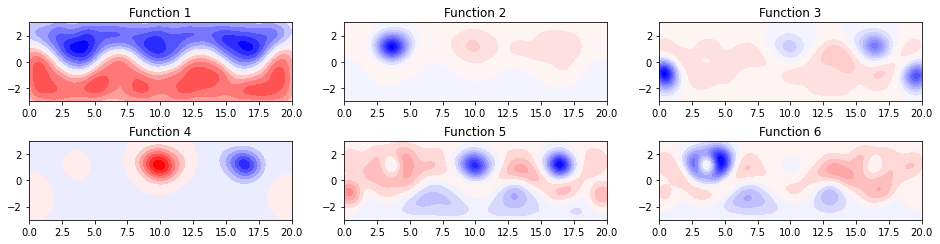

In [6]:
def plot_singular_functions(transform):
    figsize = (16, 4)
    
    grid = np.meshgrid(np.linspace(0, 20, 300), np.linspace(-3, 3, 180))
    xy = np.dstack(grid).reshape(-1, 2)
    z = transform(xy)

    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(ncols=3, nrows=2)

    for row in range(2):
        for col in range(3):
            ix = col + 3*row
            if ix < z.shape[1]:
                ax = fig.add_subplot(gs[row, col])
                f = z[:, ix].reshape(grid[0].shape)
                f /= np.max(np.abs(f))
                ax.contourf(grid[0], grid[1], f, levels=15, cmap='bwr', vmin=-1, vmax=1)
                ax.set_title(f"Function {ix+1}")
                ax.set_aspect('equal')

plot_singular_functions(lambda x: kcca.transform(x).real)

We cluster the test data in the projected space to find coherent sets.

In [7]:
from deeptime.clustering import KMeans

def cluster(X, n_iter=500, n_clusters=9):
    clusterings = [KMeans(n_clusters=n_clusters).fit_fetch(X) for _ in range(n_iter)]
    return min(clusterings, key=lambda c: c.inertia)

cluster_kcca = cluster(kcca.transform(ds_test.data).real)

Plotting the particles colored according to cluster center membership reveals the coherent set memberships.

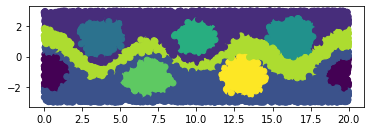

In [8]:
memberships_transform_kcca = lambda x: cluster_kcca.transform(kcca.transform(x).real)
memberships = memberships_transform_kcca(ds_test.data)

f, ax = plt.subplots(1, 1)
ax.scatter(*ds_test.data.T, c=memberships)
ax.set_aspect('equal')

Let us now add some noise to the final frame and transform it back in time to initial time to estimate the coherence score.

In [9]:
traj_test_backward = back_transform(traj_test[:, -1] + state.normal(scale=1e-1, size=traj_test[:, -1].shape))

To this end, we compare the cluster assignments and find the ones which changed compared to the initial state above. With this we can compute the expected probability that a particle stays within its own state.

In [10]:
def coherence_score(membership_transform):
    from deeptime.markov import TransitionCountEstimator
    from deeptime.markov.msm import MaximumLikelihoodMSM
    
    reference = membership_transform(Xinit_test)
    backtransformed = membership_transform(traj_test_backward[:, -1])
    
    # particle indices which did not get mapped to the same cluster center
    mismatches = np.where(reference != backtransformed)[0]
    
    dtrajs = []
    for j in range(len(backtransformed)):
        dtrajs.append(np.array([reference[j], backtransformed[j]]))

    states, counts = np.unique(reference, return_counts=True)
    cm = TransitionCountEstimator(1, 'sliding', n_states=len(states)).fit_fetch(dtrajs)
    msm = MaximumLikelihoodMSM(reversible=False, allow_disconnected=True).fit_fetch(cm)
    score = 0
    for i in range(len(states)):
        state = states[i]
        score += msm.transition_matrix[state, state] * (float(counts[i]) / float(len(reference)))
    
    return score, mismatches

def plot_mismatches(mismatches, membership_transform):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    X = Xinit_test[:5000]
    Y = ds_test.data_lagged[:5000]
    mismatches = mismatches[np.where(mismatches < 5000)[0]]
    
    ref = membership_transform(X)
    ix_good = np.arange(len(X))
    ix_good = np.setdiff1d(ix_good, mismatches, assume_unique=True)

    ax1.scatter(*X[ix_good].T, c=ref[ix_good])
    ax1.scatter(*X[mismatches].T, c='red', s=10, zorder=500, linewidths=.5)
    ax1.set_aspect('equal')
    ax1.set_ylim([-4, 4])
    ax1.set_title(r'$t=0$')

    ax2.scatter(*Y[ix_good].T, c=ref[ix_good])
    ax2.scatter(*Y[mismatches].T, c='red', s=10, zorder=500, linewidths=.5)
    ax2.set_aspect('equal')
    ax2.set_ylim([-4, 4])
    ax2.set_title(r'$t=40$')

Coherence score: 0.86


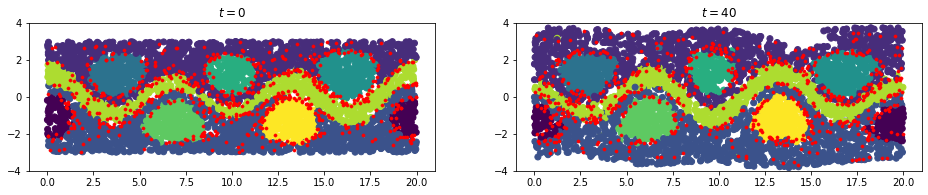

In [11]:
score_kcca, mismatches_kcca = coherence_score(memberships_transform_kcca)
print(f"Coherence score: {score_kcca:.2f}")
plot_mismatches(mismatches_kcca, memberships_transform_kcca)

## VAMPNets

In [12]:
import torch.nn as nn
from deeptime.decomposition.deep import VAMPNet

Furthermore, some of the methods work better if we map the data into three-dimensional space to deal with the quasi-periodicity:

In [33]:
ds_train_3d = TimeLaggedDataset(*[BickleyJet.to_3d(X) for X in ds_train[:]])
ds_test_3d = TimeLaggedDataset(*[BickleyJet.to_3d(X) for X in ds_test[:]])